# Import Necessary Library

In [ ]:
#Importing Libraries
import tensorflow as tf
import numpy as np
import pandas as pd
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
import matplotlib.patches as mpatches
import sys
import warnings
import os
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Dropout, GRU, Concatenate, Lambda
import keras
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

In [ ]:
# enables music21 to render images of musical notes
print('installing lilypond...')
!apt-get install lilypond > /dev/null

# converts midi files to wav files into order to play them
print('installing fluidsynth...')
!apt-get install fluidsynth > /dev/null
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2

print('installing musescore...')
!apt install musescore3 > /dev/null

print('done!')

installing lilypond...
Extracting templates from packages: 100%
installing fluidsynth...
Extracting templates from packages: 100%
installing musescore...


done!


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data Gathering & Preprocessing

## Gather, Sampling and Key Transposing

In [ ]:
#Loading the list of chopin's midi files as stream
filepath = "/content/drive/MyDrive/ClassicalMusic/chopin/"
#Getting midi files
all_midis= []
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+i
        midi_ut = converter.parse(tr)
        k = midi_ut.analyze('key')
        i = interval.Interval(k.tonic, pitch.Pitch('C'))
        midi_nt = midi_ut.transpose(i)
        midi = midi_ut.stripTies()
        all_midis.append(midi)


Gather all midis file and transpose the key of the all music to middle C

In [ ]:
all_midis = all_midis[:5]

Select 5 only chopin music.

## Music Functions

In [ ]:
def show(music):
  display(Image(str(music.write('lily.png'))))

def play(music):
  filename = music.write('mid')
  !fluidsynth -ni font.sf2 $filename -F $filename\.wav -r 16000 > /dev/null
  display(Audio(str(filename) + '.wav'))

defining functions to produce a music sheet and music audio

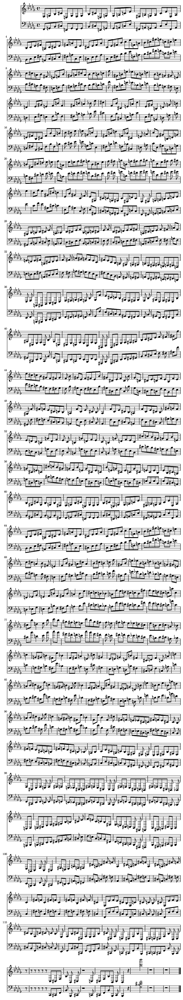

In [ ]:
show(all_midis[1])

In [ ]:
play(all_midis[1])

## Clef Splitting

In [ ]:
def split_part(midis):
  all_midis_parts = []

  for midi in midis:
    for i in range(len(midi.parts)):
      all_midis_parts.append(midi.parts[i])

  return all_midis_parts

In [ ]:
all_midi_split = split_part(all_midis)

split the midi file into parts

In [ ]:
len(all_midi_split)

11

Each of the music composed of two part which is also means two clef. There are total of 5 midi file, but there are 11 parts in total. One of the files may have more than one bass or treble clef.

In [ ]:
def split_clef(midis_parts):
  treble_clef_midi = []
  bass_clef_midi = []

  for midi in midis_parts:
    for element in midi.flat:

      clef_name = None

      if isinstance(element, music21.clef.Clef):
        clef_name = str(element.name)

        if clef_name  == 'treble':
          treble_clef_midi.append(midi)

        elif clef_name == 'bass':
          bass_clef_midi.append(midi)

  return treble_clef_midi, bass_clef_midi


In [ ]:
treble_midis, bass_midis = split_clef(all_midi_split)

Each of the part was looked for their clef property, the part with same clef property will be group together, i.e. part with treble clef property belongs to treble clef while part with bass clef property belongs to bass clef.  

In [ ]:
treble_midis

[<music21.stream.Part 0x7f12cde38730>,
 <music21.stream.Part 0x7f129d2ca0e0>,
 <music21.stream.Part 0x7f129f272e60>,
 <music21.stream.Part 0x7f1298a5da80>,
 <music21.stream.Part 0x7f1296d15d50>]

In [ ]:
bass_midis

[<music21.stream.Part 0x7f12cde386d0>,
 <music21.stream.Part 0x7f129d2ca080>,
 <music21.stream.Part 0x7f129f273400>,
 <music21.stream.Part 0x7f1298915750>,
 <music21.stream.Part 0x7f1296d14310>,
 <music21.stream.Part 0x7f1296d59210>]

## Duplicates

In [ ]:
duplicates = [element for element in bass_midis if element in treble_midis]
print(duplicates)

[]


No duplicates data

## Music Element Extraction

In [ ]:
def extract_notes_all(midi_clef):

  notes = []
  durations = []
  #types = []
  sequence_num = []

  for midi_part in midi_clef:
    for element in midi_part.flat:
      note_name = None
      duration_name  = None


    #if isinstance(element, music21.key.Key):
    # note_name = str(element.tonic.name) + ':' + str(element.mode)
    #  duration_name = "0.0"

    #elif isinstance(element, music21.meter.TimeSignature):
    #  note_name = str(element.ratioString) + 'TS'
    #  duration_name = "0.0"

      if isinstance(element, music21.chord.Chord):
        note_name = []
        duration_name = []
        for i in element.pitches:
          note_name.append(i.nameWithOctave)
        #note_name = element.pitches[-1].nameWithOctave
        #note_name = element
          #duration_name.append(element.duration.quarterLength)
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Rest):
        note_name = str(element.name)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Note):
        note_name = str(element.nameWithOctave)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      if note_name and duration_name:
        notes.append(note_name)
        durations.append(duration_name)

  return notes, durations

In [ ]:
bass_midis_element = extract_notes_all(bass_midis)
treble_midis_element = extract_notes_all(treble_midis)

The music element such as notes, chords and durations will be extracted for each clef. Noted that, each music elements of treble and bass clef are remains separated. The notes and chords are grouped together under the same feature while durations itself become another feature.

In [ ]:
bass_midis_element

(['F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'C#2',
  'G3',
  'B-3',
  'G#3',
  'B3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'C#2',
  'G3',
  'B-3',
  'G#3',
  'B3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'E-2',
  'A3',
  'C4',
  'B-3',
  'E-4',
  'F#3',
  'G#2',
  'G3',
  'B-3',
  'G#3',
  'C#4',
  'F3',
  'rest',
  'G#2',
  'G3',
  'B-3',
  'G#3',
  'C4',
  'E-3',
  'C#3',
  'G3',
  'B-3',
  'G#3',
  'C#4',
  'F3',
  'G#3',
  'F#3',
  'B3',
  'E-3',
  'F#3',
  'F3',
  'B-3',
  'C#3',
  'B-3',
  'B2',
  'B-3',
  'G#3',
  'rest',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3'

In [ ]:
len(bass_midis_element[0])

3963

In [ ]:
len(bass_midis_element[1])

3963

In [ ]:
treble_midis_element

([['C#4', 'F#4', 'B-4'],
  ['F#4', 'C#4', 'B-4'],
  ['C#4', 'B-4', 'F#4'],
  'rest',
  'F4',
  'B4',
  'G#4',
  ['F#4', 'B-4', 'C#4'],
  'rest',
  'C#4',
  ['F#4', 'B-4'],
  ['B-4', 'F#4'],
  'C#4',
  ['B-4', 'F#4'],
  'rest',
  ['B4', 'G#4'],
  ['B-4', 'F#4'],
  'rest',
  ['F4', 'G#4'],
  'rest',
  ['B-4', 'F#4'],
  'rest',
  'F4',
  ['C#5', 'B-4'],
  'rest',
  ['B4', 'G#4'],
  'rest',
  'rest',
  ['G#4', 'C#4'],
  ['C#4', 'F#4', 'B-4'],
  ['B-4', 'C#4', 'C#5'],
  ['B-4', 'F#5', 'F#4'],
  'rest',
  ['C#5', 'F5', 'G#4'],
  ['F#4', 'G#4'],
  'F5',
  'E-5',
  ['F#4', 'G#4'],
  'rest',
  ['F4', 'C#5', 'G#4'],
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'B-3',
  ['F#4', 'B-4', 'C#4'],
  ['C#4', 'F#4', 'B-4'],
  ['F#4', 'B-4'],
  'C#4',
  'rest',
  ['B4', 'F4'],
  'G#4',
  ['F#4', 'C#4', 'B-4'],
  'rest',
  ['C#4', 'B-4'],
  'F#4',
  'rest',
  [

In [ ]:
len(treble_midis_element[0])

4435

In [ ]:
len(treble_midis_element[1])

4435

## Dataframe Construction

In [ ]:
bass_df = pd.DataFrame(bass_midis_element).T
bass_df.columns = ['music_element', 'duration']
bass_df

,music_element,duration
0,F#2,0.5
1,F3,0.5
2,G#3,0.5
3,F#3,0.5
4,B-3,0.5
...,...,...
3958,E1,2.0
3959,E2,4.0
3960,rest,1.0
3961,B1,3.0


In [ ]:
treble_df = pd.DataFrame(treble_midis_element).T
treble_df.columns = ['music_element', 'duration']
treble_df

,music_element,duration
0,"[C#4, F#4, B-4]",3.0
1,"[F#4, C#4, B-4]",3.0
2,"[C#4, B-4, F#4]",3.0
3,rest,3.0
4,F4,3.0
...,...,...
4430,E4,0.25
4431,E4,1.0
4432,E4,0.75
4433,E4,0.25


There are total two dataframe constructed for each clef. Each dataframe consist of two features. The first feature named as 'music_element' where it consist of notes and chords while second feature named as 'duration' where it consist of duration only.

## Data Transformation

In [ ]:
chords_list_tr = []
for i in treble_df['music_element']:
  if type(i) == list:
    chords_list_tr.append(i)

In [ ]:
chords_list_tr

[['C#4', 'F#4', 'B-4'],
 ['F#4', 'C#4', 'B-4'],
 ['C#4', 'B-4', 'F#4'],
 ['F#4', 'B-4', 'C#4'],
 ['F#4', 'B-4'],
 ['B-4', 'F#4'],
 ['B-4', 'F#4'],
 ['B4', 'G#4'],
 ['B-4', 'F#4'],
 ['F4', 'G#4'],
 ['B-4', 'F#4'],
 ['C#5', 'B-4'],
 ['B4', 'G#4'],
 ['G#4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['B-4', 'C#4', 'C#5'],
 ['B-4', 'F#5', 'F#4'],
 ['C#5', 'F5', 'G#4'],
 ['F#4', 'G#4'],
 ['F#4', 'G#4'],
 ['F4', 'C#5', 'G#4'],
 ['F#4', 'B-4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['F#4', 'B-4'],
 ['B4', 'F4'],
 ['F#4', 'C#4', 'B-4'],
 ['C#4', 'B-4'],
 ['C#4', 'B-4', 'F#4'],
 ['F#4', 'B-4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['F#4', 'B-4', 'C#4'],
 ['B-4', 'F#4', 'C#4'],
 ['F#4', 'B-4'],
 ['G#4', 'B4'],
 ['F#4', 'B-4'],
 ['G#4', 'F4'],
 ['B-4', 'F#4'],
 ['B-4', 'C#5'],
 ['G#4', 'B4'],
 ['C#4', 'G#4'],
 ['E4', 'C#4', 'B-4'],
 ['B-4', 'E4'],
 ['B-4', 'E4', 'C#5'],
 ['E4', 'E-5', 'B-4'],
 ['C#5', 'E4', 'B-4'],
 ['G#4', 'B4', 'E-4'],
 ['C#4', 'G4', 'B-4'],
 ['G#4', 'B3', 'B4'],
 ['G#4', 'B3'],
 ['B-4', 'C#4'],
 [

In [ ]:
chords_list_bs = []
for i in bass_df['music_element']:
  if type(i) == list:
    chords_list_bs.append(i)

In [ ]:
chords_list_bs

[['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'E-4'],
 ['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'C#4'],
 ['E-3', 'C4'],
 ['E-3', 'B-3'],
 ['G#2', 'B-3'],
 ['G#2', 'G#3'],
 ['G#3', 'G#2'],
 ['C#3', 'G#3'],
 ['E-3', 'G#3'],
 ['C#3', 'G#3'],
 ['G#2', 'G#3'],
 ['C#3', 'G#3'],
 ['E-3', 'G#3'],
 ['C#3', 'G#3'],
 ['F#3', 'G#3'],
 ['F3', 'G#3'],
 ['G#2', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'C#4'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'B3'],
 ['C#3', 'B-3'],
 ['C#3', 'G#3'],
 ['F#2', 'G#3'],
 ['F#2', 'F#3'],
 ['F#3', 'F#2'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['E-3', 'F#3'],
 ['F#3', 'E-3'],
 ['E-3', 'F#3'],
 ['E-3', 'F#3'],
 ['C#3', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#3', 'B2'],
 ['B2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['C#3', 'F#3'],
 ['E-3', 'F#3'],
 ['F#3', 'E-3'],
 ['B2', 'F#3'],
 ['B2', 'F

In [ ]:
unique_chords_tr = list(np.unique(np.array(chords_list_tr, dtype="object")))

In [ ]:
chords_dict_tr = dict()
for i in range(len((unique_chords_tr))):
  if type(unique_chords_tr[i]) == list:
    chords_dict_tr[str('CH') + str(i)] =unique_chords_tr[i]

In [ ]:
chords_dict_tr

{'CH0': ['A4', 'E-4', 'C5'],
 'CH1': ['A4', 'E-4', 'E-5'],
 'CH2': ['A4', 'F5', 'E-4'],
 'CH3': ['A5', 'G#5'],
 'CH4': ['B-3', 'A4'],
 'CH5': ['B-3', 'B-4'],
 'CH6': ['B-3', 'C#4', 'B-4'],
 'CH7': ['B-3', 'D4', 'B-4'],
 'CH8': ['B-3', 'E-4', 'B-4'],
 'CH9': ['B-3', 'E4', 'B-4'],
 'CH10': ['B-3', 'F#4'],
 'CH11': ['B-3', 'F4', 'B-4'],
 'CH12': ['B-3', 'G4', 'B-4'],
 'CH13': ['B-4', 'B-3'],
 'CH14': ['B-4', 'B-3', 'C#4'],
 'CH15': ['B-4', 'B-5'],
 'CH16': ['B-4', 'B-5', 'G5'],
 'CH17': ['B-4', 'C#4'],
 'CH18': ['B-4', 'C#4', 'C#5'],
 'CH19': ['B-4', 'C#5'],
 'CH20': ['B-4', 'C#5', 'E4'],
 'CH21': ['B-4', 'E4'],
 'CH22': ['B-4', 'E4', 'C#5'],
 'CH23': ['B-4', 'F#4'],
 'CH24': ['B-4', 'F#4', 'C#4'],
 'CH25': ['B-4', 'F#5'],
 'CH26': ['B-4', 'F#5', 'F#4'],
 'CH27': ['B-4', 'G5'],
 'CH28': ['B-5', 'A5'],
 'CH29': ['B-5', 'B-4'],
 'CH30': ['B-5', 'C#5', 'G5'],
 'CH31': ['B-5', 'F#5'],
 'CH32': ['B-5', 'G5'],
 'CH33': ['B-5', 'G5', 'B-4'],
 'CH34': ['B-5', 'G5', 'C#5'],
 'CH35': ['B-6', 'B-5']

In [ ]:
unique_chords_bs = list(np.unique(np.array(chords_list_bs, dtype="object")))

In [ ]:
chords_dict_bs = dict()
for i in range(len((unique_chords_bs))):
  if type(unique_chords_bs[i]) == list:
    chords_dict_bs[str('CH') + str(i)] =unique_chords_bs[i]

In [ ]:
chords_dict_bs

{'CH0': ['A1', 'A2'],
 'CH1': ['A3', 'C#4'],
 'CH2': ['A3', 'C4', 'E3'],
 'CH3': ['A3', 'E-3'],
 'CH4': ['A4', 'C4', 'A3'],
 'CH5': ['A4', 'F#4', 'E-4', 'C4'],
 'CH6': ['B-1', 'B-2'],
 'CH7': ['B-1', 'B1'],
 'CH8': ['B-1', 'B1', 'C#2', 'B1', 'C#2'],
 'CH9': ['B-2', 'B-3'],
 'CH10': ['B-2', 'D3', 'G#3'],
 'CH11': ['B-2', 'E-3', 'G3'],
 'CH12': ['B-2', 'F#3'],
 'CH13': ['B-2', 'F3'],
 'CH14': ['B-2', 'F3', 'C#4'],
 'CH15': ['B-2', 'F3', 'G#3'],
 'CH16': ['B-2', 'G#3'],
 'CH17': ['B-2', 'G3'],
 'CH18': ['B-3', 'B-2'],
 'CH19': ['B-3', 'C#3'],
 'CH20': ['B-3', 'C#4'],
 'CH21': ['B-3', 'D4'],
 'CH22': ['B-3', 'E-4'],
 'CH23': ['B-3', 'F#3', 'C#3'],
 'CH24': ['B-3', 'F3', 'C#3', 'C#4'],
 'CH25': ['B-3', 'G3'],
 'CH26': ['B-3', 'G4', 'B-4'],
 'CH27': ['B-4', 'F#4', 'C#4'],
 'CH28': ['B-5', 'G5', 'B-4'],
 'CH29': ['B1', 'B2'],
 'CH30': ['B1', 'C#2', 'B1', 'C#2', 'B1'],
 'CH31': ['B2', 'F#3'],
 'CH32': ['B2', 'G#3'],
 'CH33': ['B3', 'D4', 'F#3'],
 'CH34': ['B3', 'E-4', 'F4', 'G#4'],
 'CH35': ['

In [ ]:
unique_duration_tr = list(np.unique(np.array(treble_df['duration'])))

In [ ]:
duration_dict_tr = dict()
for i in range(len((unique_duration_tr))):
    duration_dict_tr[str('DR') + str(i)] =unique_duration_tr[i]

In [ ]:
duration_dict_tr

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.4166666666666667,
 'DR5': 0.5,
 'DR6': 0.5833333333333334,
 'DR7': 0.6666666666666666,
 'DR8': 0.75,
 'DR9': 1.0,
 'DR10': 1.25,
 'DR11': 1.3333333333333333,
 'DR12': 1.5,
 'DR13': 2.0,
 'DR14': 2.25,
 'DR15': 2.5,
 'DR16': 2.6666666666666665,
 'DR17': 2.75,
 'DR18': 3.0,
 'DR19': 3.5,
 'DR20': 4.0,
 'DR21': 5.25,
 'DR22': 5.5,
 'DR23': 5.75,
 'DR24': 6.0}

In [ ]:
unique_duration_bs = list(np.unique(np.array(bass_df['duration'])))

In [ ]:
duration_dict_bs = dict()
for i in range(len((unique_duration_bs))):
    duration_dict_bs[str('DR') + str(i)] =unique_duration_bs[i]

In [ ]:
duration_dict_bs

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.5,
 'DR5': 0.5833333333333334,
 'DR6': 0.6666666666666666,
 'DR7': 0.75,
 'DR8': 1.0,
 'DR9': 1.25,
 'DR10': 1.5,
 'DR11': 1.6666666666666667,
 'DR12': 2.0,
 'DR13': 2.3333333333333335,
 'DR14': 2.5,
 'DR15': 2.6666666666666665,
 'DR16': 3.0,
 'DR17': 3.3333333333333335,
 'DR18': 4.0,
 'DR19': 6.0}

In [ ]:
for chord_str, chord_note_lst in chords_dict_tr.items():
  treble_df['music_element'] = treble_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

for chord_str, chord_note_lst in chords_dict_bs.items():
  bass_df['music_element'] = bass_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

In [ ]:
for duration_str, duration_lst in duration_dict_tr.items():
  treble_df['duration'] = treble_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

for duration_str, duration_lst in duration_dict_bs.items():
  bass_df['duration'] = bass_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

In [ ]:
bass_df

,music_element,duration
0,F#2,DR4
1,F3,DR4
2,G#3,DR4
3,F#3,DR4
4,B-3,DR4
...,...,...
3958,E1,DR12
3959,E2,DR18
3960,rest,DR8
3961,B1,DR16


In [ ]:
treble_df

,music_element,duration
0,CH46,DR18
1,CH97,DR18
2,CH44,DR18
3,rest,DR18
4,F4,DR18
...,...,...
4430,E4,DR2
4431,E4,DR9
4432,E4,DR8
4433,E4,DR2


Transform both dataframe where list of chords were changed to chords label and numerical representation of duration data was transformed to categorical data.

## Label Encoding

In [ ]:
label_encoder_chord_tr = preprocessing.LabelEncoder()

label_encoder_chord_tr.fit_transform(treble_df['music_element'])
treble_df['music_element']= label_encoder_chord_tr.transform(treble_df['music_element'])

label_encoder_chord_bs = preprocessing.LabelEncoder()

label_encoder_chord_bs.fit_transform(bass_df['music_element'])
bass_df['music_element']= label_encoder_chord_bs.transform(bass_df['music_element'])

In [ ]:
label_encoder_duration_tr = preprocessing.LabelEncoder()

label_encoder_duration_tr.fit_transform(treble_df['duration'])
treble_df['duration']= label_encoder_duration_tr.transform(treble_df['duration'])

label_encoder_duration_bs = preprocessing.LabelEncoder()

label_encoder_duration_bs.fit_transform(bass_df['duration'])
bass_df['duration']= label_encoder_duration_bs.transform(bass_df['duration'])

In [ ]:
bass_df

,music_element,duration
0,280,14
1,286,14
2,292,14
3,281,14
4,7,14
...,...,...
3958,275,4
3959,276,10
3960,298,18
3961,10,8


In [ ]:
treble_df

,music_element,duration
0,110,10
1,166,10
2,108,10
3,205,10
4,191,10
...,...,...
4430,180,12
4431,180,24
4432,180,23
4433,180,12


Change the whole dataframe categorical data to numerical data by using label encoding.

## Array Constructions

In [ ]:
sequence_length = 100
train_note_tr = []
train_duration_tr = []
for i in range(len(treble_df) - sequence_length):
        train_note_tr.append(treble_df['music_element'][i:i+sequence_length])
        train_duration_tr.append(treble_df['duration'][i:i+sequence_length])

In [ ]:
train_note_bs = []
train_duration_bs = []
for i in range(len(bass_df) - sequence_length):
        train_note_bs.append(bass_df['music_element'][i:i+sequence_length])
        train_duration_bs.append(bass_df['duration'][i:i+sequence_length])

Construct 2 array from each dataframe. There are total 4 arrays which are treble note array, treble duration array, bass note array and bass duration array. Each array consist of 100 sequence data.

## One Hot Encoding

In [ ]:
train_note_tr = tf.keras.utils.to_categorical(train_note_tr).transpose(0,2,1)
train_duration_tr = tf.keras.utils.to_categorical(train_duration_tr).transpose(0,2,1)
train_note_bs = tf.keras.utils.to_categorical(train_note_bs).transpose(0,2,1)
train_duration_bs = tf.keras.utils.to_categorical(train_duration_bs).transpose(0,2,1)

In [ ]:
train_note_tr = np.array(train_note_tr, np.float64)
train_duration_tr = np.array(train_duration_tr, np.float64)
train_note_bs = np.array(train_note_bs, np.float64)
train_duration_bs = np.array(train_duration_bs, np.float64)

All arrays undergo one hot encoding becoming three dimensional array.

## Flattening

In [ ]:
n_samples_note_tr = train_note_tr.shape[0]
n_note_tr = train_note_tr.shape[1]
input_dim_note_tr = n_note_tr * sequence_length

n_samples_dur_tr = train_duration_tr.shape[0]
n_dur_tr = train_duration_tr.shape[1]
input_dim_dur_tr = n_dur_tr * sequence_length

n_samples_note_bs = train_note_bs.shape[0]
n_note_bs = train_note_bs.shape[1]
input_dim_note_bs = n_note_bs * sequence_length

n_samples_dur_bs = train_duration_bs.shape[0]
n_dur_bs = train_duration_bs.shape[1]
input_dim_dur_bs = n_dur_bs * sequence_length

In [ ]:
train_note_tr_flat = train_note_tr.reshape(n_samples_note_tr, input_dim_note_tr)
train_dur_tr_flat = train_duration_tr.reshape(n_samples_dur_tr, input_dim_dur_tr)
train_note_bs_flat = train_note_bs.reshape(n_samples_note_bs, input_dim_note_bs)
train_dur_bs_flat = train_duration_bs.reshape(n_samples_dur_bs, input_dim_dur_bs)

All arrays is flattened from three dimensional array to two dimensional array with the shape of (number of samples of the that array, vocab size of that array times the sequence length).

# Modelling - VAE

## Model Architecture - Treble

In [ ]:
latent_dim = 64

Defining the latent dimension

In [ ]:
from keras import layers
class Sampling(layers.Layer):

    def __init__(self, beta=.5, *args, **kwargs):
        self.is_placeholder = True
        self.beta = beta
        super(Sampling, self).__init__(*args, **kwargs)

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch, dim))
        #kl_batch = - .5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
        #self.add_loss(K.mean(kl_batch), inputs=inputs)
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

Defining the sampling layer.

In [ ]:

encoder_input_note = Input(shape = (input_dim_note_tr), name = 'input_note')
dense_note1 = Dense(1024)(encoder_input_note)
dense_note2 = Dense(512)(dense_note1)
dense_note3 = Dense(128)(dense_note2)
z_mean_note = Dense(latent_dim, name="z_mean_note")(dense_note3)
z_log_var_note = Dense(latent_dim, name="z_log_var_note")(dense_note3)


encoder_input_dur = Input(shape = (input_dim_dur_tr), name = 'input_dur')
dense_dur1 = Dense(1024)(encoder_input_dur)
dense_dur2 = Dense(512)(dense_dur1)
dense_dur3 = Dense(128)(dense_dur2)

z_mean_dur = Dense(latent_dim, name="z_mean_dur")(dense_dur3)
z_log_var_dur = Dense(latent_dim, name="z_log_var_dur")(dense_dur3)

concat_note_dur = Concatenate()([dense_note3, dense_dur3])
dense_combine = Dense(latent_dim, activation ="relu")(concat_note_dur)

z_note = Sampling()([z_mean_note, z_log_var_note])
z_note_end = Concatenate()([z_note, dense_combine])

z_dur = Sampling()([z_mean_dur, z_log_var_dur])
z_dur_end = Concatenate()([z_dur, dense_combine])

latent_note = Input(shape=(latent_dim + latent_dim))
decoded_note = Dense((latent_dim))(latent_note)
note_out = Dense(input_dim_note_tr, name='music_element', activation = 'sigmoid')(decoded_note)

latent_dur = Input(shape=(latent_dim + latent_dim))
decoded_dur = Dense((latent_dim))(latent_dur)
duration_out = Dense(input_dim_dur_tr, name='duration', activation = 'sigmoid')(decoded_dur)

encoder_note = Model([encoder_input_note, encoder_input_dur], [z_mean_note, z_log_var_note, z_note_end], name="encoder_note")
decoder_note = Model(latent_note, note_out, name = 'decoder_note')

encoder_dur = Model([encoder_input_dur, encoder_input_note], [z_mean_dur, z_log_var_dur, z_dur_end], name="encoder_dur")
decoder_dur = Model(latent_dur, duration_out, name = 'decoder_dur')

In [ ]:
encoder_note.summary()

Model: "encoder_note"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_note (InputLayer)     [(None, 20600)]              0         []                            
                                                                                                  
 input_dur (InputLayer)      [(None, 2500)]               0         []                            
                                                                                                  
 dense (Dense)               (None, 1024)                 2109542   ['input_note[0][0]']          
                                                          4                                       
                                                                                                  
 dense_3 (Dense)             (None, 1024)                 2561024   ['input_dur[0][0]']

In [ ]:
encoder_dur.summary()

Model: "encoder_dur"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_dur (InputLayer)      [(None, 2500)]               0         []                            
                                                                                                  
 input_note (InputLayer)     [(None, 20600)]              0         []                            
                                                                                                  
 dense_3 (Dense)             (None, 1024)                 2561024   ['input_dur[0][0]']           
                                                                                                  
 dense (Dense)               (None, 1024)                 2109542   ['input_note[0][0]']          
                                                          4                             

In [ ]:
decoder_note.summary()

Model: "decoder_note"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128)]             0         
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 music_element (Dense)       (None, 20600)             1339000   
                                                                 
Total params: 1347256 (5.14 MB)
Trainable params: 1347256 (5.14 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
decoder_dur.summary()

Model: "decoder_dur"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128)]             0         
                                                                 
 dense_8 (Dense)             (None, 64)                8256      
                                                                 
 duration (Dense)            (None, 2500)              162500    
                                                                 
Total params: 170756 (667.02 KB)
Trainable params: 170756 (667.02 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
vae_tr = tf.keras.Model([encoder_input_note, encoder_input_dur], [decoder_note(z_dur_end), decoder_dur(z_dur_end)], name = "MutiVAE_TR")

In [ ]:
vae_tr.summary()

Model: "MutiVAE_TR"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_dur (InputLayer)      [(None, 2500)]               0         []                            
                                                                                                  
 input_note (InputLayer)     [(None, 20600)]              0         []                            
                                                                                                  
 dense_3 (Dense)             (None, 1024)                 2561024   ['input_dur[0][0]']           
                                                                                                  
 dense (Dense)               (None, 1024)                 2109542   ['input_note[0][0]']          
                                                          4                              

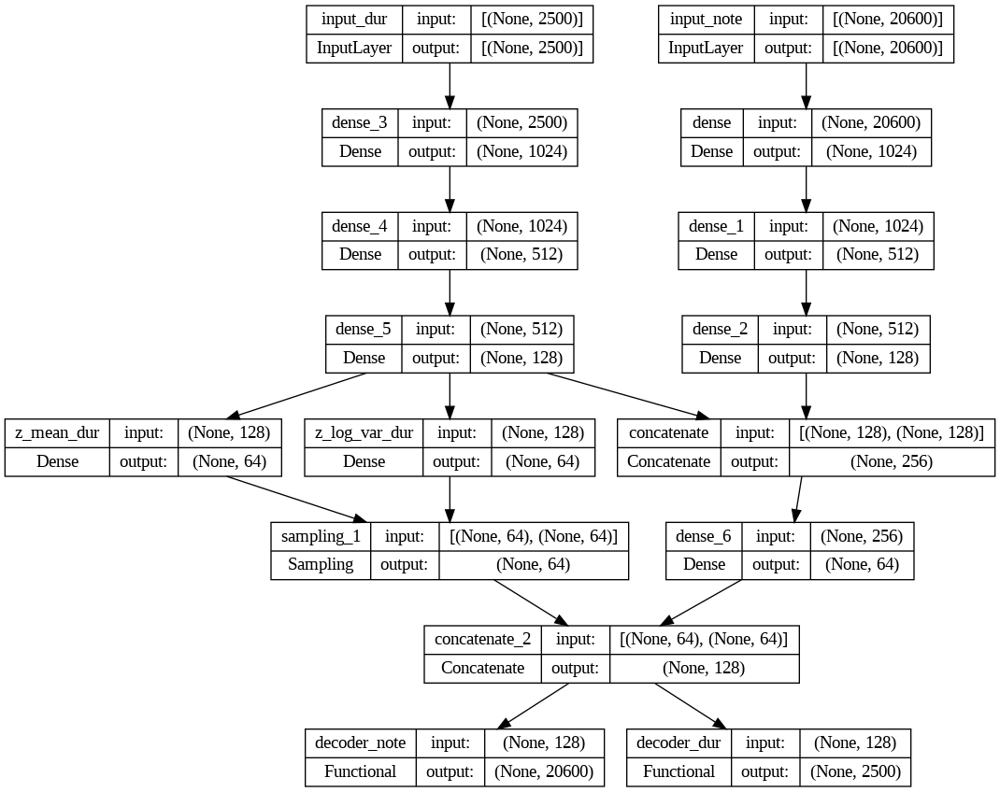

In [ ]:
keras.utils.plot_model(vae_tr, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

## VAE Loss - Treble

In [ ]:
reconstructionLoss_note = tf.keras.losses.binary_crossentropy(vae_tr.inputs[0], vae_tr.outputs[0])
# Define the Kullback-Liebler divergence term.
klLoss_note = -0.5 * tf.reduce_mean(1 + z_log_var_note - tf.square(z_mean_note) - tf.exp(z_log_var_note), axis = -1)

# Combine the reconstruction and KL loss terms.
vaeLoss_note = reconstructionLoss_note + klLoss_note

reconstructionLoss_dur = tf.keras.losses.binary_crossentropy(vae_tr.inputs[1], vae_tr.outputs[1])
# Define the Kullback-Liebler divergence term.
klLoss_dur = -0.5 * tf.reduce_mean(1 + z_log_var_dur - tf.square(z_mean_dur) - tf.exp(z_log_var_dur), axis = -1)

# Combine the reconstruction and KL loss terms.
vaeLoss_dur = reconstructionLoss_dur + klLoss_dur

# Add the loss to the model.
vae_tr.add_loss(vaeLoss_note)
vae_tr.add_loss(vaeLoss_dur)

vae_tr.add_metric(vaeLoss_note, name = "vaeLoss_note")
vae_tr.add_metric(vaeLoss_dur, name = "vaeLoss_dur")

In [ ]:
vae_tr.compile(optimizer='adam')

In [ ]:
tf.config.run_functions_eagerly(True)

## Model training - Treble

Epoch 1/25
136/136 [==============================] - 70s 512ms/step - loss: 0.2919 - vaeLoss_note: 0.1100 - vaeLoss_dur: 0.1820
Epoch 2/25
136/136 [==============================] - 70s 511ms/step - loss: 0.1087 - vaeLoss_note: 0.0299 - vaeLoss_dur: 0.0788
Epoch 3/25
136/136 [==============================] - 70s 516ms/step - loss: 0.1007 - vaeLoss_note: 0.0258 - vaeLoss_dur: 0.0749
Epoch 4/25
136/136 [==============================] - 70s 516ms/step - loss: 0.0963 - vaeLoss_note: 0.0248 - vaeLoss_dur: 0.0715
Epoch 5/25
136/136 [==============================] - 68s 498ms/step - loss: 0.0918 - vaeLoss_note: 0.0255 - vaeLoss_dur: 0.0663
Epoch 6/25
136/136 [==============================] - 67s 496ms/step - loss: 0.0864 - vaeLoss_note: 0.0249 - vaeLoss_dur: 0.0615
Epoch 7/25
136/136 [==============================] - 68s 500ms/step - loss: 0.0834 - vaeLoss_note: 0.0247 - vaeLoss_dur: 0.0587
Epoch 8/25
136/136 [==============================] - 71s 525ms/step - loss: 0.0811 - vaeLoss_not

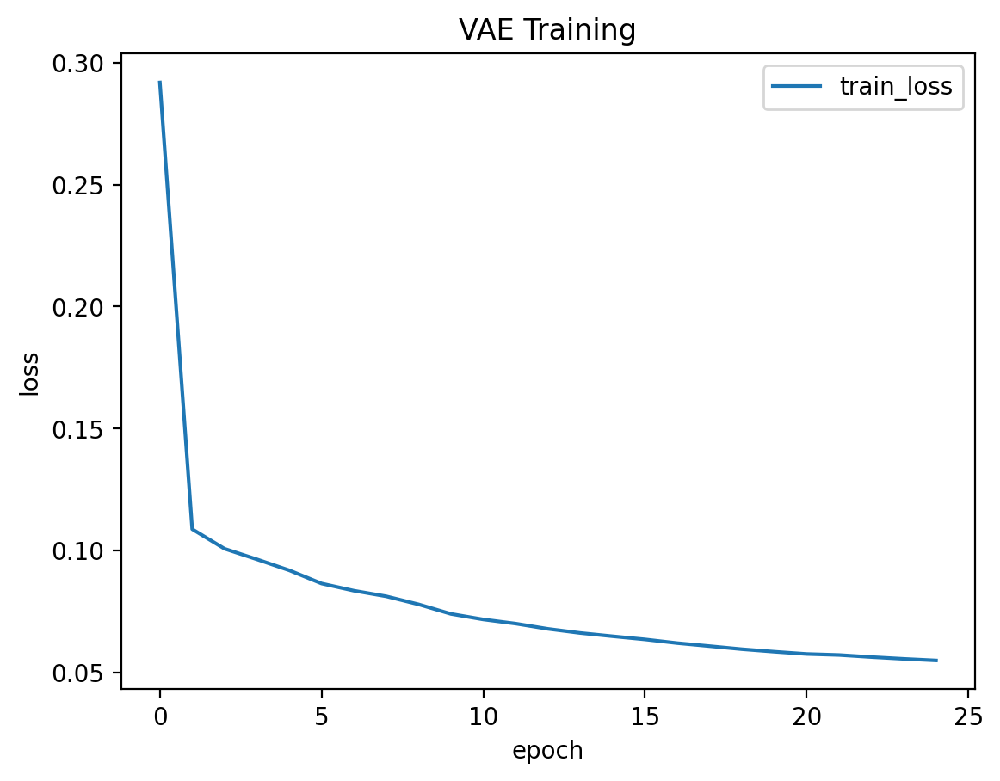

In [ ]:
history = vae_tr.fit([train_note_tr_flat,train_dur_tr_flat],  epochs=25,verbose = 1)

train_loss = history.history['loss']

plt.plot(train_loss)
plt.title('VAE Training')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss'], loc='upper right')
plt.show()

## Model Architecture - Bass

In [ ]:
#temp = 0.5

encoder_input_note = Input(shape = (input_dim_note_bs), name = 'input_note')
dense_note1 = Dense(1024)(encoder_input_note)
dense_note2 = Dense(512)(dense_note1)
dense_note3 = Dense(128)(dense_note2)
z_mean_note = Dense(latent_dim, name="z_mean_note")(dense_note3)
z_log_var_note = Dense(latent_dim, name="z_log_var_note")(dense_note3)


encoder_input_dur = Input(shape = (input_dim_dur_bs), name = 'input_dur')
dense_dur1 = Dense(1024)(encoder_input_dur)
dense_dur2 = Dense(512)(dense_dur1)
dense_dur3 = Dense(128)(dense_dur2)

z_mean_dur = Dense(latent_dim, name="z_mean_dur")(dense_dur3)
z_log_var_dur = Dense(latent_dim, name="z_log_var_dur")(dense_dur3)

concat_note_dur = Concatenate()([dense_note3, dense_dur3])
dense_combine = Dense(latent_dim, activation ="relu")(concat_note_dur)

z_note = Sampling()([z_mean_note, z_log_var_note])
z_note_end = Concatenate()([z_note, dense_combine])

z_dur = Sampling()([z_mean_dur, z_log_var_dur])
z_dur_end = Concatenate()([z_dur, dense_combine])

latent_note = Input(shape=(latent_dim + latent_dim))
decoded_note = Dense((latent_dim))(latent_note)
#temp_note = Lambda(lambda x: x / temp)(decoded_note)
note_out = Dense(input_dim_note_bs, name='music_element', activation = 'softmax')(decoded_note)

latent_dur = Input(shape=(latent_dim + latent_dim))
decoded_dur = Dense((latent_dim))(latent_dur)
#temp_dur = Lambda(lambda x: x / temp)(decoded_dur)
duration_out = Dense(input_dim_dur_bs, name='duration', activation = 'softmax')(decoded_dur)

encoder_note = Model([encoder_input_note, encoder_input_dur], [z_mean_note, z_log_var_note, z_note_end], name="encoder_note")
decoder_note = Model(latent_note, note_out, name = 'decoder_note')

encoder_dur = Model([encoder_input_dur, encoder_input_note], [z_mean_dur, z_log_var_dur, z_dur_end], name="encoder_dur")
decoder_dur = Model(latent_dur, duration_out, name = 'decoder_dur')

In [ ]:
encoder_note.summary()

Model: "encoder_note"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_note (InputLayer)     [(None, 29900)]              0         []                            
                                                                                                  
 input_dur (InputLayer)      [(None, 2000)]               0         []                            
                                                                                                  
 dense_9 (Dense)             (None, 1024)                 3061862   ['input_note[0][0]']          
                                                          4                                       
                                                                                                  
 dense_12 (Dense)            (None, 1024)                 2049024   ['input_dur[0][0]']

In [ ]:
encoder_dur.summary()

Model: "encoder_dur"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_dur (InputLayer)      [(None, 2000)]               0         []                            
                                                                                                  
 input_note (InputLayer)     [(None, 29900)]              0         []                            
                                                                                                  
 dense_12 (Dense)            (None, 1024)                 2049024   ['input_dur[0][0]']           
                                                                                                  
 dense_9 (Dense)             (None, 1024)                 3061862   ['input_note[0][0]']          
                                                          4                             

In [ ]:
decoder_note.summary()

Model: "decoder_note"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128)]             0         
                                                                 
 dense_16 (Dense)            (None, 64)                8256      
                                                                 
 music_element (Dense)       (None, 29900)             1943500   
                                                                 
Total params: 1951756 (7.45 MB)
Trainable params: 1951756 (7.45 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
decoder_dur.summary()

Model: "decoder_dur"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 128)]             0         
                                                                 
 dense_17 (Dense)            (None, 64)                8256      
                                                                 
 duration (Dense)            (None, 2000)              130000    
                                                                 
Total params: 138256 (540.06 KB)
Trainable params: 138256 (540.06 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
vae_bs = tf.keras.Model([encoder_input_note, encoder_input_dur], [decoder_note(z_dur_end), decoder_dur(z_dur_end)], name = "MutiVAE_BS")

In [ ]:
vae_bs.summary()

Model: "MutiVAE_BS"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_dur (InputLayer)      [(None, 2000)]               0         []                            
                                                                                                  
 input_note (InputLayer)     [(None, 29900)]              0         []                            
                                                                                                  
 dense_12 (Dense)            (None, 1024)                 2049024   ['input_dur[0][0]']           
                                                                                                  
 dense_9 (Dense)             (None, 1024)                 3061862   ['input_note[0][0]']          
                                                          4                              

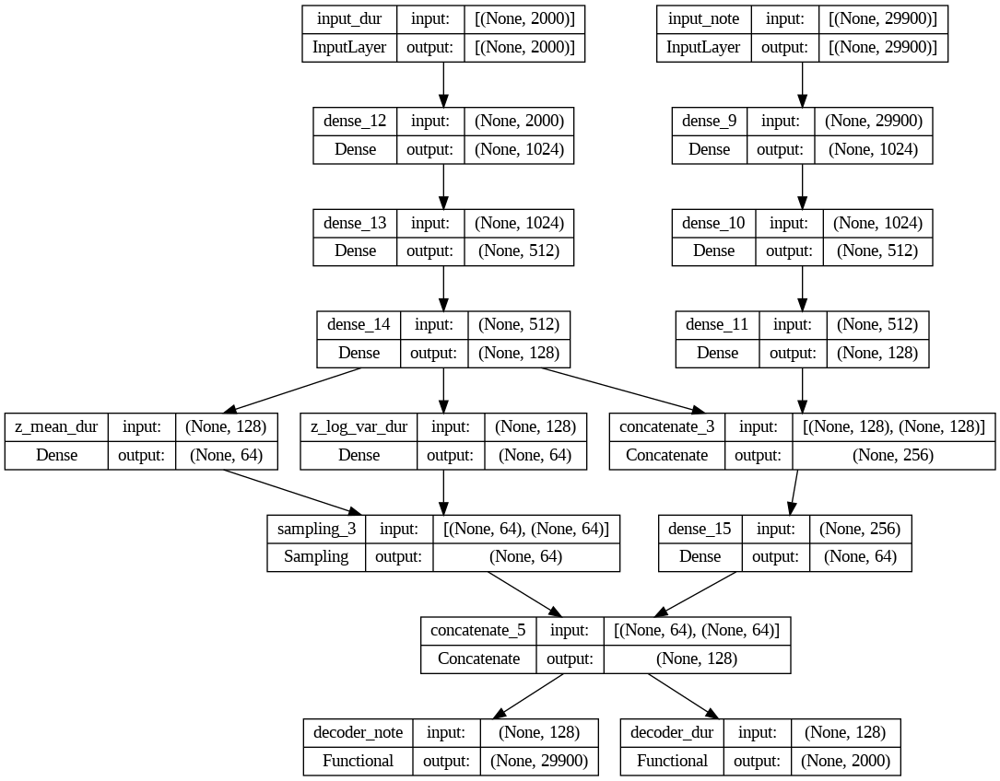

In [ ]:
keras.utils.plot_model(vae_bs, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

## VAE Loss -  Bass

In [ ]:
reconstructionLoss_note = tf.keras.losses.binary_crossentropy(vae_bs.inputs[0], vae_bs.outputs[0])
# Define the Kullback-Liebler divergence term.
klLoss_note = -0.5 * tf.reduce_mean(1 + z_log_var_note - tf.square(z_mean_note) - tf.exp(z_log_var_note), axis = -1)

# Combine the reconstruction and KL loss terms.
vaeLoss_note = reconstructionLoss_note + klLoss_note

reconstructionLoss_dur = tf.keras.losses.binary_crossentropy(vae_bs.inputs[1], vae_bs.outputs[1])
# Define the Kullback-Liebler divergence term.
klLoss_dur = -0.5 * tf.reduce_mean(1 + z_log_var_dur - tf.square(z_mean_dur) - tf.exp(z_log_var_dur), axis = -1)

# Combine the reconstruction and KL loss terms.
vaeLoss_dur = reconstructionLoss_dur + klLoss_dur

# Add the loss to the model.
vae_bs.add_loss(vaeLoss_note)
vae_bs.add_loss(vaeLoss_dur)

vae_bs.add_metric(vaeLoss_note, name = "vaeLoss_note")
vae_bs.add_metric(vaeLoss_dur, name = "vaeLoss_dur")

In [ ]:
vae_bs.compile(optimizer='adam')

In [ ]:
tf.config.run_functions_eagerly(True)

## Model Training - Bass

Epoch 1/25
121/121 [==============================] - 80s 660ms/step - loss: 0.3341 - vaeLoss_note: 0.1116 - vaeLoss_dur: 0.2224
Epoch 2/25
121/121 [==============================] - 78s 646ms/step - loss: 0.1328 - vaeLoss_note: 0.0259 - vaeLoss_dur: 0.1069
Epoch 3/25
121/121 [==============================] - 79s 655ms/step - loss: 0.1134 - vaeLoss_note: 0.0192 - vaeLoss_dur: 0.0942
Epoch 4/25
121/121 [==============================] - 81s 671ms/step - loss: 0.1039 - vaeLoss_note: 0.0168 - vaeLoss_dur: 0.0871
Epoch 5/25
121/121 [==============================] - 81s 673ms/step - loss: 0.0969 - vaeLoss_note: 0.0157 - vaeLoss_dur: 0.0812
Epoch 6/25
121/121 [==============================] - 82s 676ms/step - loss: 0.0913 - vaeLoss_note: 0.0154 - vaeLoss_dur: 0.0759
Epoch 7/25
121/121 [==============================] - 79s 656ms/step - loss: 0.0863 - vaeLoss_note: 0.0154 - vaeLoss_dur: 0.0709
Epoch 8/25
121/121 [==============================] - 87s 713ms/step - loss: 0.0836 - vaeLoss_not

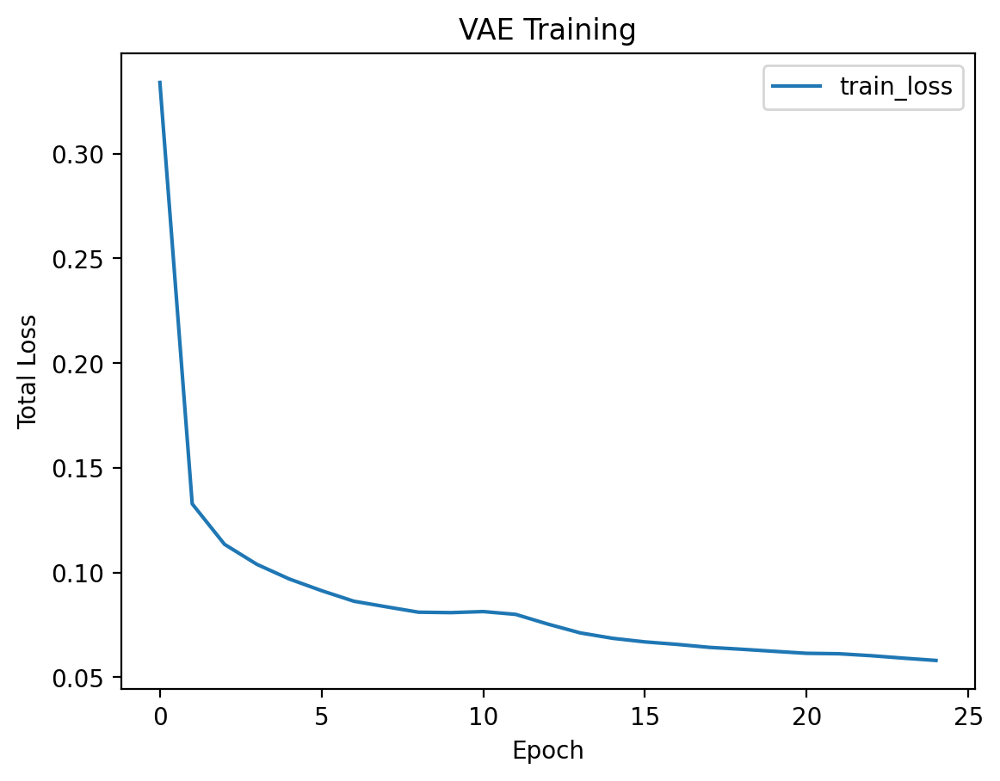

In [ ]:
history = vae_bs.fit([train_note_bs_flat,train_dur_bs_flat],  epochs=25,verbose = 1)

train_loss = history.history['loss']

plt.plot(train_loss)
plt.title('VAE Training')
plt.ylabel('Total Loss')
plt.xlabel('Epoch')
plt.legend(['train_loss'], loc='upper right')
plt.show()

## Music Elements Prediction - Treble

In [ ]:
test_note_tr = train_note_tr[0].reshape(1, train_note_tr[0].shape[0]*train_note_tr[0].shape[1])
test_dur_tr = train_duration_tr[0].reshape(1, train_duration_tr[0].shape[0]*train_duration_tr[0].shape[1])

In [ ]:
pred_tr = vae_tr.predict([test_note_tr, test_dur_tr])

1/1 [==============================] - 0s 90ms/step


In [ ]:
pred_tr

[array([[2.3228407e-04, 5.9794336e-05, 8.2548719e-04, ..., 7.3536977e-02,
         1.0629279e-01, 1.6778521e-01]], dtype=float32),
 array([[0.00456459, 0.00252469, 0.01368286, ..., 0.05310099, 0.10376151,
         0.02778289]], dtype=float32)]

In [ ]:
pred_note_tr = pred_tr[0][0].reshape(sequence_length, n_note_tr)

In [ ]:
pred_note_tr.shape

(100, 206)

In [ ]:
pred_dur_tr = pred_tr[1][0].reshape(sequence_length, n_dur_tr)

In [ ]:
pred_dur_tr

array([[4.5645949e-03, 2.5246933e-03, 1.3682861e-02, ..., 2.1938935e-03,
        1.4973503e-03, 4.9948189e-03],
       [6.2520127e-04, 1.7862890e-03, 9.7736306e-03, ..., 5.0414996e-03,
        6.2563464e-02, 1.7143343e-02],
       [5.7060633e-02, 4.1940571e-03, 2.0137748e-04, ..., 6.1970815e-04,
        1.8376688e-04, 1.9810230e-03],
       ...,
       [4.4714436e-03, 9.3409857e-03, 4.6410676e-02, ..., 1.2035282e-02,
        4.5874111e-02, 9.7212438e-03],
       [1.0432430e-01, 1.1475594e-02, 5.0162878e-03, ..., 2.8061192e-02,
        1.1026239e-01, 8.2423531e-02],
       [1.9973496e-01, 1.8638778e-01, 1.7558330e-01, ..., 5.3100988e-02,
        1.0376151e-01, 2.7782895e-02]], dtype=float32)

Use first 100 sequence in the training data for validation data. Generate 100 new sequence data based on the training model for treble notes data and treble durations data.

Noted that, the training data is also use for validation data due to new data may have new music element that the model could not identified which will causing errors in predicting the music element.

The random 100 sequences data will be used later in the music generations to produced variety of music.

## Music Elements Prediction - Bass

In [ ]:
test_note_bs = train_note_bs[0].reshape(1, train_note_bs[0].shape[0]*train_note_bs[0].shape[1])
test_dur_bs = train_duration_bs[0].reshape(1, train_duration_bs[0].shape[0]*train_duration_bs[0].shape[1])

In [ ]:
pred_bs = vae_bs.predict([test_note_bs, test_dur_bs])

1/1 [==============================] - 0s 47ms/step


In [ ]:
pred_bs

[array([[1.9149104e-05, 3.2965404e-06, 1.6122277e-06, ..., 9.0583833e-04,
         2.7801841e-03, 2.6177652e-03]], dtype=float32),
 array([[1.8159648e-08, 2.2761264e-09, 2.1200499e-09, ..., 8.1768849e-11,
         3.8304681e-12, 3.1661470e-12]], dtype=float32)]

In [ ]:
pred_note_bs = pred_bs[0][0].reshape(sequence_length, n_note_bs)

In [ ]:
pred_note_bs.shape

(100, 299)

In [ ]:
pred_dur_bs = pred_bs[1][0].reshape(sequence_length, n_dur_bs)

In [ ]:
pred_dur_bs

array([[1.81596480e-08, 2.27612640e-09, 2.12004991e-09, ...,
        7.02050373e-09, 1.39394540e-08, 1.38906184e-08],
       [3.23402709e-08, 1.33582934e-09, 4.68255479e-09, ...,
        1.12251115e-08, 4.74205475e-09, 4.64894256e-09],
       [1.36586265e-09, 8.37306502e-10, 1.54739455e-09, ...,
        8.16639922e-10, 5.76886205e-10, 2.27515715e-10],
       ...,
       [2.41628505e-11, 4.12679252e-10, 1.15983499e-11, ...,
        5.64583758e-09, 2.42736359e-10, 1.40452661e-09],
       [1.38459679e-08, 2.00260719e-09, 8.44136039e-10, ...,
        6.99455716e-10, 6.00086161e-11, 2.85759038e-11],
       [1.63924388e-10, 2.16095614e-10, 3.84440785e-10, ...,
        8.17688486e-11, 3.83046806e-12, 3.16614703e-12]], dtype=float32)

Use first 100 sequence in the training data for validation data. Generate 100 new sequence data based on the training model for bass notes data and bass durations data.

# Music Generation

## Top K sampling

In [ ]:
def processing_ouputVAE(predicted_notes, predicted_duration, sequence_length):
  p_element, i_element = tf.math.top_k(predicted_notes,k=10)
  p_duration, i_duration = tf.math.top_k(predicted_duration,k=5)

  p_element = p_element.numpy()
  p_duration = p_duration.numpy()
  i_element = i_element.numpy()
  i_duration = i_duration.numpy()

  generated_notes = []
  generated_durations = []

  for i in range(sequence_length):
    p_element[i] /= p_element[i].sum()
    p_duration[i] /= p_duration[i].sum()

    p_element[i][-1] = 1 - np.sum(p_element[i][0:-1])
    element = np.random.choice(i_element[i], 1, p=p_element[i] )
    generated_notes.append(element[0])

    p_duration[i][-1] = 1 - np.sum(p_duration[i][0:-1])
    duration = np.random.choice(i_duration[i], 1, p=p_duration[i] )
    generated_durations.append(duration[0])

  generated_music_df = pd.DataFrame(list(zip(generated_notes, generated_durations)), columns =['music_element', 'duration'])

  return generated_music_df

function above is for top k sampling.

## Dataframe Construction - Treble

In [ ]:
generated_tr_vae = processing_ouputVAE(pred_note_tr, pred_dur_tr, sequence_length)

In [ ]:
generated_tr_vae

,music_element,duration
0,110,10
1,196,17
2,196,0
3,16,5
4,117,9
...,...,...
95,157,24
96,102,4
97,202,16
98,187,16


## Inverse Label Encoding - Treble

In [ ]:
generated_tr_vae['music_element'] = label_encoder_chord_tr.inverse_transform(generated_tr_vae['music_element'])
generated_tr_vae['duration']= label_encoder_duration_tr.inverse_transform(generated_tr_vae['duration'])

## Inverse Transformation - Treble

In [ ]:
for element_str, element_lst in chords_dict_tr.items():
  generated_tr_vae['music_element'] = generated_tr_vae['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_tr.items():
  generated_tr_vae['duration'] = generated_tr_vae['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
generated_tr_vae

,music_element,duration
0,"[C#4, F#4, B-4]",3.000000
1,G#3,6.000000
2,G#3,0.083333
3,C#4,2.000000
4,"[C#5, B-4]",2.750000
...,...,...
95,"[E4, C#4, B-4]",1.000000
96,"[B4, E-4]",1.500000
97,G4,5.750000
98,F#5,5.750000


## Dataframe Construction - Bass

In [ ]:
generated_bs_vae = processing_ouputVAE(pred_note_bs, pred_dur_bs, sequence_length)

In [ ]:
generated_bs_vae

,music_element,duration
0,161,0
1,201,17
2,154,4
3,288,18
4,214,19
...,...,...
95,294,16
96,90,16
97,267,12
98,258,0


## Inverse Label Encoding - Bass

In [ ]:
generated_bs_vae['music_element'] = label_encoder_chord_bs.inverse_transform(generated_bs_vae['music_element'])
generated_bs_vae['duration']= label_encoder_duration_bs.inverse_transform(generated_bs_vae['duration'])

## Inverse Transformation - Bass

In [ ]:
for element_str, element_lst in chords_dict_bs.items():
  generated_bs_vae['music_element'] = generated_bs_vae['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_bs.items():
  generated_bs_vae['duration'] = generated_bs_vae['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
generated_bs_vae

,music_element,duration
0,"[G#3, F4]",0.083333
1,"[B3, G#3]",0.750000
2,"[G#3, D3, B3]",2.000000
3,F5,1.000000
4,"[A4, F#4, E-4, C4]",1.250000
...,...,...
95,G1,0.666667
96,"[F#2, E-3]",0.666667
97,"[D4, B-3, F3]",0.250000
98,"[B-2, B-3]",0.083333


## Music Score and Stream Initialization

In [ ]:
main_stream = stream.Score(id='mainScore')
stream_part1 = stream.Part(id='Part1')
stream_part2 = stream.Part(id='Part2')
instrument1 = instrument.Piano()
clef1 = clef.TrebleClef()
clef2 = clef.BassClef()
tempos = tm2 = tempo.MetronomeMark(number=90)
keys = key.Key(pitch.Pitch('C'))
time_signature = meter.TimeSignature('4/4')
key_order = ['music_element', 'duration']

## Music Stream Construction

In [ ]:
def music_generation_part(stream_part, instrument, clef, tempo, key, time_signature, set_element):

  for i in [instrument, clef, tempo, key, time_signature]:
    stream_part.append(i)

  for notes, durations in zip(set_element[key_order[0]],set_element[key_order[1]]):
    note_name = None

    if type(notes) != list:

      if notes != 'rest':
        note_name = note.Note(notes)
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

      elif notes == 'rest':
        note_name = note.Rest()
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

    elif type(notes) == list:
      note_name = chord.Chord(notes)
      note_name.duration.quarterLength = durations
      stream_part.append(note_name)

  return stream_part

Function above add and submit the generated treble and bass clef data into music stream.

In [ ]:
treble_generation_part_vae = music_generation_part(stream_part1, instrument1, clef1, tempos, keys, time_signature, generated_tr_vae)

In [ ]:
bass_generation_part_vae = music_generation_part(stream_part2, instrument1, clef2, tempos, keys, time_signature, generated_bs_vae)

## Music Streams Balancing

In [ ]:
def convert_to_float(frac_str):
    try:
        return float(frac_str)
    except ValueError:
        num, denom = frac_str.split('/')
        try:
            leading, num = num.split(' ')
            whole = float(leading)
        except ValueError:
            whole = 0
        frac = float(num) / float(denom)
        return whole - frac if whole < 0 else whole + frac

In [ ]:
for i in bass_generation_part_vae:
  if convert_to_float(i.offset) > convert_to_float(treble_generation_part_vae[-1].offset):
    bass_generation_part_vae.remove(i)

for i in treble_generation_part_vae:
  if convert_to_float(i.offset) > convert_to_float(bass_generation_part_vae[-1].offset):
    treble_generation_part_vae.remove(i)

## Music Streams Balancing

Balancing both treble clef and bass clef generated data to make sure the length of both clef is the same. Noted that, eventhought both have similar sequence, the duration of the notes play importance role in stream length. Where longer duration causes stream length to be longer and vice versa.

## Music Score Construction

In [ ]:
def music_generation_main(main_score, stream_parts_list):
  for i in stream_parts_list:
    main_score.insert(0, i)

  return main_score

In [ ]:
music_generated_vae = music_generation_main(main_stream, [treble_generation_part_vae, bass_generation_part_vae])

Add the music stream of treble clef and bass clef to music score.

# Music Generated

In [ ]:
music_generated_vae.show('text')

{0.0} <music21.stream.Part Part1>
    {0.0} <music21.instrument.Piano 'Piano'>
    {0.0} <music21.clef.TrebleClef>
    {0.0} <music21.tempo.MetronomeMark maestoso Quarter=90>
    {0.0} <music21.key.Key of C major>
    {0.0} <music21.meter.TimeSignature 4/4>
    {0.0} <music21.chord.Chord C#4 F#4 B-4>
    {3.0} <music21.note.Note G#>
    {9.0} <music21.note.Note G#>
    {9.0833} <music21.note.Note C#>
    {11.0833} <music21.chord.Chord C#5 B-4>
    {13.8333} <music21.chord.Chord F#4 E-4>
    {14.1667} <music21.chord.Chord B-3 G4 B-4>
    {14.25} <music21.chord.Chord F#4 B-4>
    {14.3333} <music21.note.Note B>
    {17.8333} <music21.chord.Chord B4 D5>
    {18.1667} <music21.chord.Chord G6 E-6 B-5 G5>
    {23.6667} <music21.chord.Chord F#5 F5>
    {24.1667} <music21.chord.Chord C#5 F5 G#4>
    {29.9167} <music21.chord.Chord E-7 G6>
    {32.5833} <music21.chord.Chord C#5 E4 B-4>
    {32.9167} <music21.note.Note F>
    {33.25} <music21.note.Note A>
    {39.0} <music21.note.Note G#>
    {39

## Music Sheet

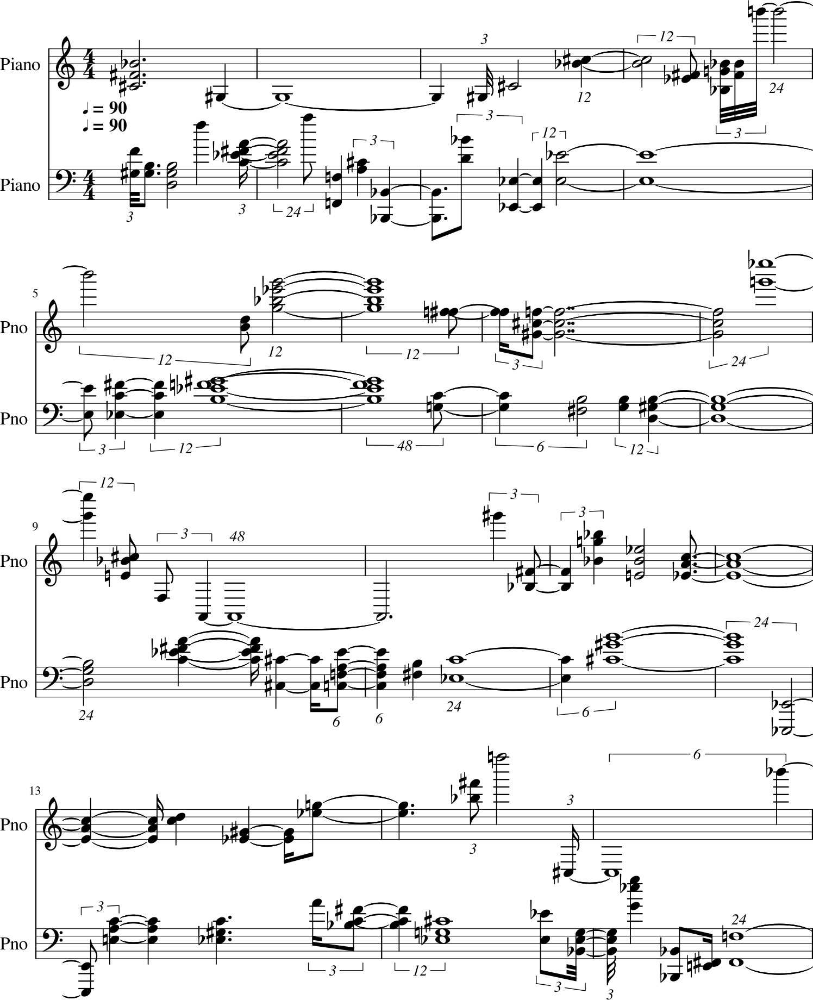

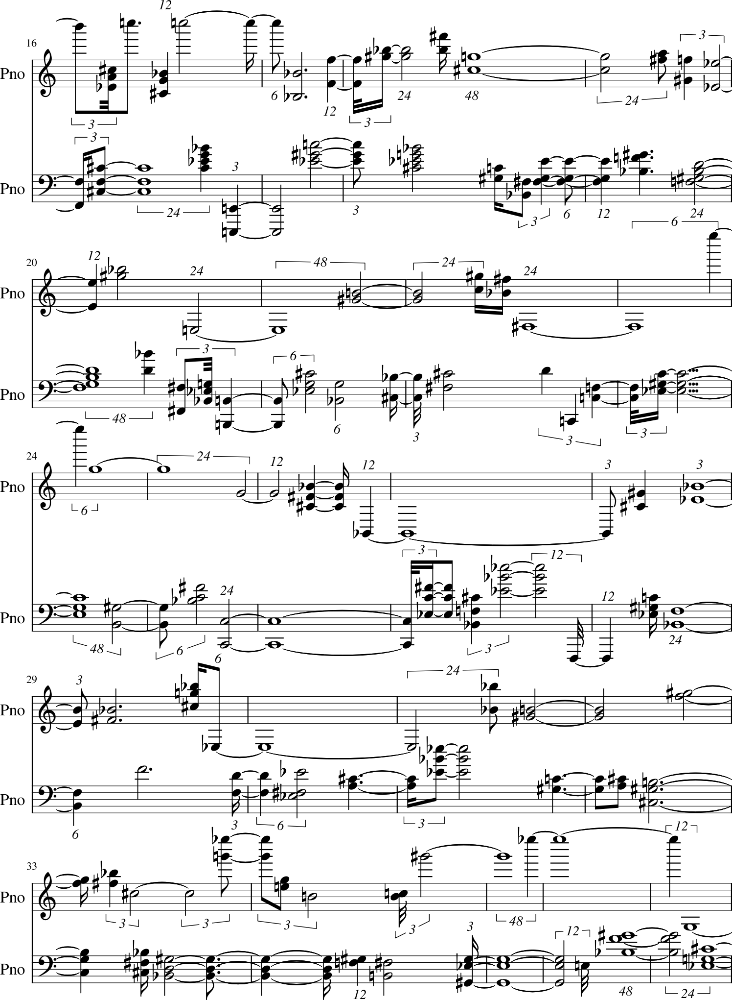

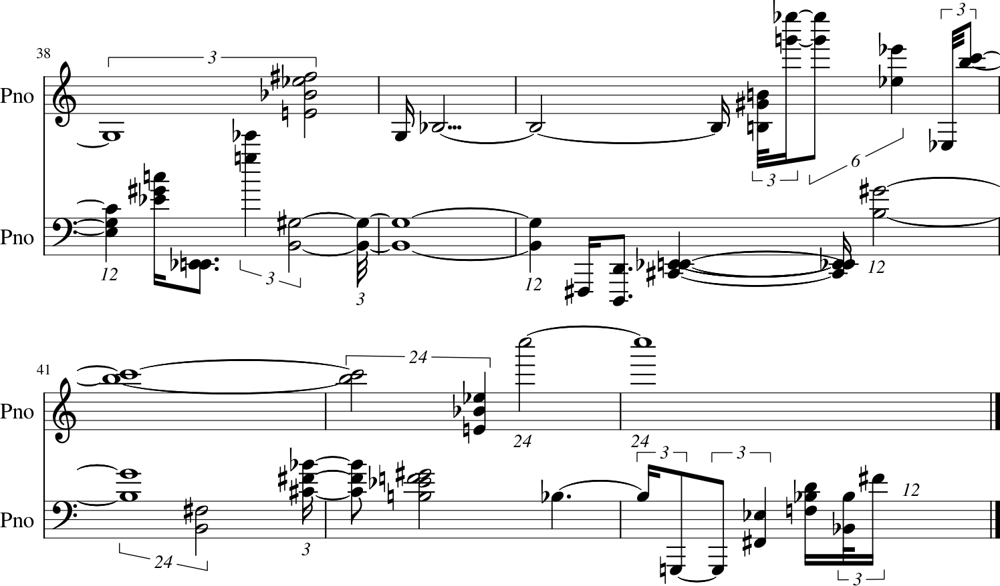

In [ ]:
music_generated_vae.show()

## Music Audio

In [ ]:
play(music_generated_vae)

# Save Model

In [ ]:
vae_tr.save("/content/drive/MyDrive/ClassicalMusic/ModelChopin/MugenVAE_tr")

In [ ]:
vae_bs.save("/content/drive/MyDrive/ClassicalMusic/ModelChopin/MugenVAE_bs")